In [41]:
import numpy as np

class MD:
    def __init__(self, n_particles, box_length, temperature, dt=0.005):
        self.n_particles = n_particles
        self.box_length = box_length
        self.temperature = temperature
        self.dt = dt
        self.positions, self.old_positions, self.velocities, self.U_kin = self.initialise_system()
        self.forces, self.potential_energy, self.pressure = self.calculate_forces()

    def initialise_system(self):

        positions = np.zeros((self.n_particles, 3))
        old_positions = np.zeros((self.n_particles, 3))
        velocities = np.zeros((self.n_particles, 3))
        forces = np.zeros((self.n_particles, 3))

        n_per_dim = int(np.ceil(self.n_particles ** (1/3)))

        # Calculate the spacing between particles
        spacing = box_length / n_per_dim

        counter = 0

        # Place particles on a lattice
        for i in range(n_per_dim):
            for j in range(n_per_dim):
                for k in range(n_per_dim):
                    if counter < self.n_particles:
                        positions[counter] = np.array([i, j, k]) * spacing
                        counter += 1

        # Initialize velocities with Maxwell-Boltzmann distribution
        velocities = np.random.normal(0, np.sqrt(self.temperature), (self.n_particles, 3))

        # Remove center of mass motion
        momentum = np.sum(velocities, axis=0) / self.n_particles
        velocities -= momentum

        # Rescale velocities to match desired temperature
        kinetic_energy = 0.5 * np.sum(velocities**2)
        scale_factor = np.sqrt((3 * self.n_particles * self.temperature) / (2 * kinetic_energy))
        velocities *= scale_factor

        # Get old position
        old_positions = positions - velocities * self.dt

        return positions, old_positions, velocities, kinetic_energy

    def calculate_forces(self):
        forces = np.zeros((self.n_particles, 3))
        potential_energy = 0.0
        pressure = 0.0
        
        cutoff = 2.25  # In LJ units, 2.25σ
        cutoff2 = cutoff ** 2
        ecut = 4 * (cutoff**-12 - cutoff**-6)  # Correct cutoff energy shift
        
        for i in range(self.n_particles):
            for j in range(i + 1, self.n_particles):
                xr = self.positions[i] - self.positions[j]
                # Minimum image convention (PBC)
                xr -= self.box_length * np.round(xr / self.box_length)
                r2 = np.dot(xr, xr)
                
                if r2 < cutoff2:  
                    r2i = 1.0 / r2
                    r6i = r2i ** 3
                    force_magnitude = 48 * r2i * r6i * (r6i - 0.5)  # LJ potential force magnitude
                    force = force_magnitude * xr
                    
                    forces[i] += force
                    forces[j] -= force
                
                    potential_energy += 4 * r6i * (r6i - 1) - ecut  # Shifted LJ potential
                    pressure += np.dot(force, xr)
        
        # Pressure normalization
        pressure /= (3.0 * self.box_length ** 3)
        
        return forces, potential_energy, pressure



    # def calculate_forces(self):
    #     forces = np.zeros((self.n_particles, 3))
    #     potential_energy = 0.0
    #     pressure = 0.0
        
    #     for i in range(self.n_particles):
    #         cutoff = 2.25 # In LJ units, 2.25σ
    #         ecut = 4 * (cutoff**-12 - cutoff**-6)

    #         for j in range(i+1, self.n_particles):
    #             xr = self.positions[i] - self.positions[j]
    #             # Minimum image convention (PBC)
    #             xr -= self.box_length * np.round(xr / self.box_length)
    #             r = np.linalg.norm(xr)
    #             r2 = np.dot(xr, xr)
                 
    #             if r2 < cutoff **2:  
    #                 r2i = 1 / r2
    #                 r6i = r2i**3
    #                 force_magnitude = 48 * r2i * r6i * (r6i - 0.5) # LJ potential
    #                 forces[i] += force_magnitude * xr
    #                 forces[j] -= force_magnitude * xr
    #                 potential_energy += 4 * r6i * (r6i - 1) - ecut  # LJ potential
    #                 pressure += np.dot(forces[i], xr) / (3 * self.box_length**3)
        
    #     return forces, potential_energy, pressure
   
    def euler(self):
        new_positions = self.positions + self.velocities * self.dt + 0.5 * self.forces * self.dt ** 2
        self.positions = new_positions
        new_velocities = self.velocities + 0.5 * self.forces * self.dt
        self.velocities = new_velocities

    def verlet(self):

        new_positions = np.zeros((self.n_particles, 3))
        new_positions = 2.0 * self.positions - self.old_positions + (self.forces * self.dt ** 2)
        self.velocities = (new_positions - self.old_positions) / (2.0 * self.dt)
        self.U_kin = 0.5 * np.sum(self.velocities**2)
        self.old_positions = self.positions
        self.positions = new_positions

    # def velocity_verlet(self):
    #     velocities_half = self.velocities + 0.5 * self.forces * self.dt
    #     self.positions += velocities_half * self.dt
    #     self.forces = self.calculate_forces()[0]
    #     self.velocities = velocities_half + 0.5 * self.forces * self.dt
    def velocity_verlet(self):
        # 1. Half-step velocity update
        velocities_half = self.velocities + 0.5 * self.forces * self.dt
        
        # 2. Full position update
        self.positions += velocities_half * self.dt
        
        # 3. Recalculate forces based on the new positions
        self.forces, self.potential_energy, self.pressure = self.calculate_forces()
        
        # 4. Full-step velocity update using the new forces
        self.velocities = velocities_half + 0.5 * self.forces * self.dt


            
    def calculate_temperature(self):
        # Calculate kinetic energy
        kinetic_energy = 0.5 * np.sum(self.velocities**2)
        # Calculate temperature
        temperature = (2 * kinetic_energy) / (3 * self.n_particles)
        return temperature

    def do_MD(self, n_steps):

        properties = np.zeros((n_steps, 5))
        positions = np.zeros((n_steps, self.n_particles, 3))
        for step in range(n_steps):

            self.forces, self.potential_energy, self.pressure = self.calculate_forces()

            # self.euler()
            self.velocity_verlet()
            kinetic_energy = 0.5 * np.sum(self.velocities**2)
            total_energy = kinetic_energy + self.potential_energy
            temperature = self.calculate_temperature()
            properties[step] = np.array([step, kinetic_energy, self.potential_energy, total_energy, temperature])
            positions[step][:] = self.positions
            header = "# step kinetic_energy potential_energy total_energy temperature"

            print(f"Step {step}, Kinetic Energy: {kinetic_energy:.3f}, Potential Energy: {self.potential_energy:.3f}, Total Energy: {total_energy:.3f}, Temperature: {temperature:.2f}")
        np.savetxt('data.txt', properties, header=header, comments='', fmt='%.8f')
        np.save('positions.npy', positions)


        return positions, properties

# Example usage:
n_particles = 100
box_length = 3.67  # In LJ units, 10σ
temperature = 0.788  # In LJ units, kB*T/ε = 1.0
dt = 0.001  # Time step in LJ units
n_steps = 100000

md_simulation = MD(n_particles, box_length, temperature, dt)
positions, properties = md_simulation.do_MD(n_steps)


Step 0, Kinetic Energy: 263.065, Potential Energy: 36953.897, Total Energy: 37216.962, Temperature: 1.75
Step 1, Kinetic Energy: 674.720, Potential Energy: 36538.850, Total Energy: 37213.570, Temperature: 4.50
Step 2, Kinetic Energy: 1301.314, Potential Energy: 35908.167, Total Energy: 37209.481, Temperature: 8.68
Step 3, Kinetic Energy: 2077.487, Potential Energy: 35128.358, Total Energy: 37205.845, Temperature: 13.85
Step 4, Kinetic Energy: 2941.242, Potential Energy: 34261.716, Total Energy: 37202.959, Temperature: 19.61
Step 5, Kinetic Energy: 3839.955, Potential Energy: 33360.707, Total Energy: 37200.662, Temperature: 25.60
Step 6, Kinetic Energy: 4729.756, Potential Energy: 32469.158, Total Energy: 37198.914, Temperature: 31.53
Step 7, Kinetic Energy: 5575.498, Potential Energy: 31622.375, Total Energy: 37197.873, Temperature: 37.17
Step 8, Kinetic Energy: 6352.928, Potential Energy: 30844.720, Total Energy: 37197.648, Temperature: 42.35
Step 9, Kinetic Energy: 7050.454, Potentia

Text(0, 0.5, 'U / ε')

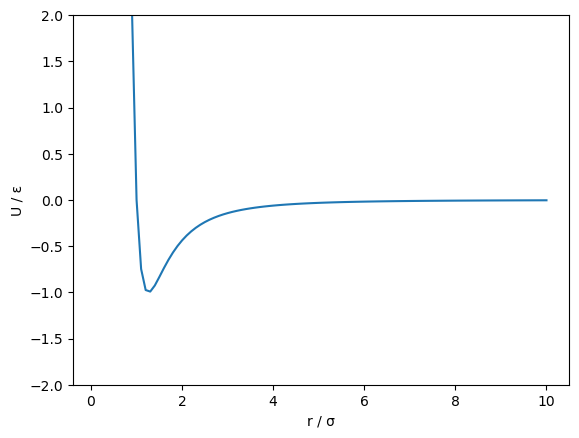

In [63]:
import matplotlib.pyplot as plt
x = np.linspace(0.1, 10, 100)
r2i = 1 / x
r6i = r2i**3
 
ecut = 0
y = 4 * r6i * (r6i - 1) - ecut
plt.plot(x,y)
plt.ylim(-2, 2)
plt.xlabel('r / σ')
plt.ylabel('U / ε')

#here epsilon = 1 and sigma = 1 

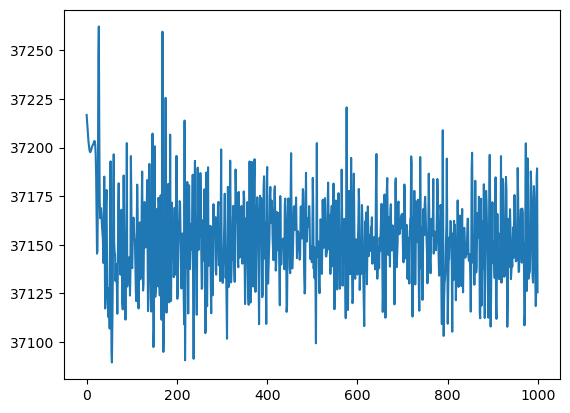

In [37]:
data = np.loadtxt('data.txt')
tot_energy = data[:,3]
plt.plot(np.arange(1000), tot_energy)

In [38]:
positions = np.load('positions.npy')
positions[0][0].shape

(3,)

In [39]:
def get_rdf(positions, nbins=100):
    gr = np.zeros((nbins,2))
    dg = box_length / (2 * nbins)

    bin_index = 0
    for k in range(positions.shape[0]):
        print(k)
        for i in range(n_particles):
            for j in range(i+1, n_particles):
                rij = positions[k][i] - positions[k][j]
                rij -= box_length * np.round(rij / box_length)
                r = np.linalg.norm(rij)
                if r < box_length / 2:
                    bin_index = int(r / dg)
                    gr[bin_index][1] += 2
    
    for i in range(nbins): #final normalisation
        r = (i + 0.5) * dg
        v = (4 * np.pi / 3) * (n_particles / box_length**3) * dg**3 * ((i + 1) **3 - i**3)
        gr[i][1] /= (v * n_particles)
        gr[i][0] = r

    return gr

rdf = get_rdf(positions)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

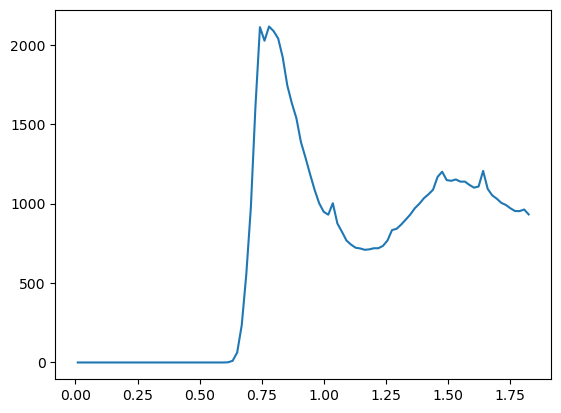

In [40]:
import matplotlib.pyplot as plt
bins = rdf[:,0]
g = rdf[:,1]
plt.plot(bins, g)   

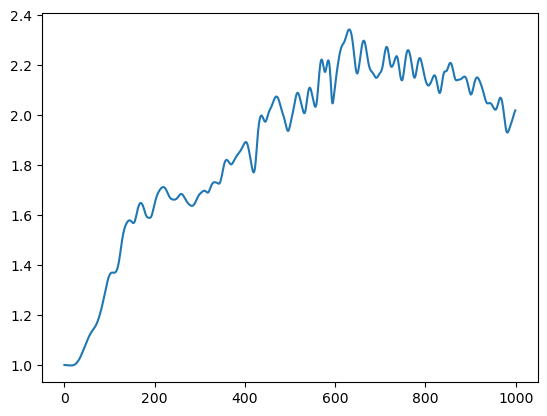

In [11]:
import matplotlib.pyplot as plt
temp = simulation[:,4]
plt.plot(np.arange(len(temp)), temp)

In [8]:
n_particles = 100
box_length = 10
temperature = 300
dt = 1.0
md_system = MD(n_particles, box_length, temperature, dt)

In [29]:
import ase
from ase import Atoms
from ase.visualize import view
md_system = MD(n_particles, box_length, temperature, dt)
system = Atoms(['Ar'] * md_system.n_particles, positions = md_system.positions)

In [30]:
view(system)

<Popen: returncode: None args: ['/home/nco24/software/anaconda3/envs/caco3/b...>

usage: ase [-h] [--version] [-T]
           {help,info,test,gui,db,run,band-structure,build,dimensionality,eos,ulm,find,nebplot,nomad-upload,nomad-get,convert,reciprocal,completion,diff,exec}
           ...
ase: error: TclError: couldn't connect to display "localhost:11.0"
To get a full traceback, use: ase -T gui ...
